In [55]:
import tifffile
from matplotlib import pyplot as plt
import numpy as np
import tensorflow as tf


train_feature_file = '/home/cb/sis/biodata/train_features/001b0634_S2_00.tif'
train_agbm_file = '/home/cb/sis/biodata/train_agbm/001b0634_agbm.tif'
train_feature = tifffile.imread(train_feature_file)
train_agbm = tifffile.imread(train_agbm_file)

print(train_feature.shape)
print(train_agbm.shape)

(256, 256, 11)
(256, 256)


In [56]:
print(np.amax(train_feature[:,:,0]))
print(np.amax(train_feature[:,:,1]))
print(np.amax(train_feature[:,:,2]))
print(np.amax(train_feature[:,:,3]))
print(np.amax(train_feature))

2106
2224
2308
2308
6632


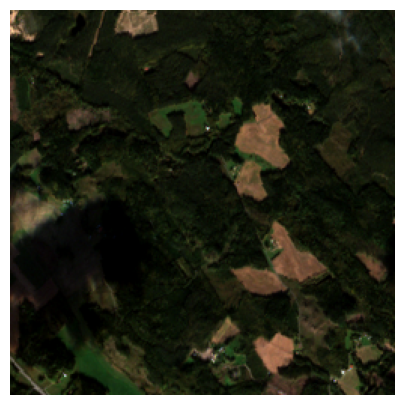

In [225]:
# Normalize bands into 0.0 - 1.0 scale
def normalize(array):
    array_min, array_max = array.min(), array.max()
    return (array - array_min) / (array_max - array_min)

def plot_feature_rgb(train_feature):
    train_feature_rgb = normalize(train_feature[:,:,0:3])
    train_feature_rgb = train_feature_rgb[:,:,::-1]
    plt.figure(figsize=(5,5))
    plt.imshow(train_feature_rgb)
    plt.axis('off')
    plt.show()

plot_feature_rgb(train_feature)

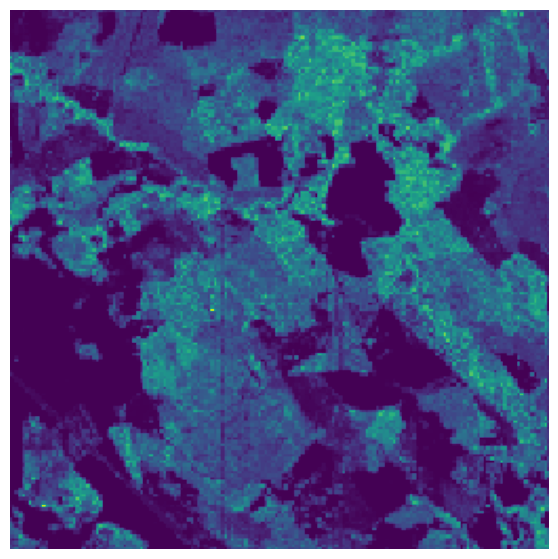

In [43]:
plt.figure(figsize=(7,7))
plt.imshow(train_agbm)
plt.axis('off')
plt.show()

In [223]:
def save_train_tensor(train_feature, train_agbm, tfrecord_path):
    # train_feature_tensor = tf.convert_to_tensor(train_feature)
    # train_agbm_tensor = tf.convert_to_tensor(train_agbm)

    writer = tf.io.TFRecordWriter(tfrecord_path)

    example = tf.train.Example(features=tf.train.Features(feature={
        'train_feature': tf.train.Feature(float_list=tf.train.FloatList(value=train_feature.flatten())),
        'train_agbm': tf.train.Feature(float_list=tf.train.FloatList(value=train_agbm.flatten())),
    }))

    writer.write(example.SerializeToString())
    writer.close()


(256, 256)
2106.0
2224.0
2308.0
2308.0
6632.0


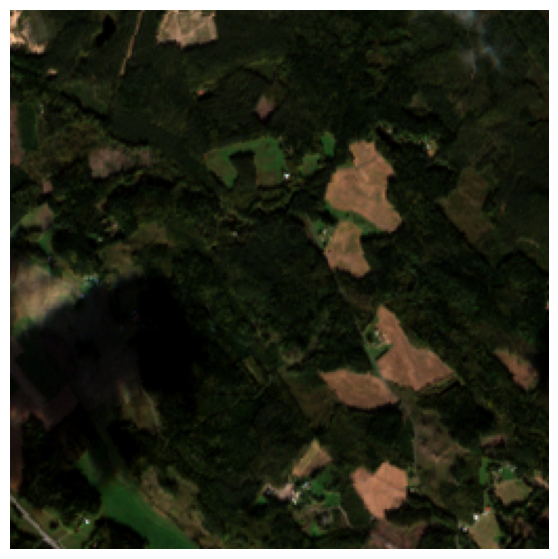

In [74]:
# Define the feature description
feature_description = {
    'train_feature': tf.io.FixedLenFeature([256, 256, 11], tf.float32),
    'train_agbm': tf.io.FixedLenFeature([256, 256], tf.float32),
}

# Define a function to parse the examples
def parse_example(example_proto):
    example = tf.io.parse_single_example(example_proto, feature_description)
    array_256 = example['train_feature']
    array_128 = example['train_agbm']
    return array_256, array_128

# Create a TFRecordDataset
tfrecord_path = '/home/cb/sis/biodata/test.tfrecord'
dataset = tf.data.TFRecordDataset(tfrecord_path)

# Apply the parsing function to each example
dataset = dataset.map(parse_example)

# Perform any additional transformations or preprocessing
# dataset = dataset.shuffle(...)
# dataset = dataset.batch(...)
# dataset = dataset.prefetch(...)

# Iterate over the dataset during training
for array_256, array_128 in dataset:
    # Use the arrays for training
    # model.train(array_256, array_128, ...)
    print(array_128.shape)
    print(np.amax(array_256[:,:,0]))
    print(np.amax(array_256[:,:,1]))
    print(np.amax(array_256[:,:,2]))
    print(np.amax(array_256[:,:,3]))
    print(np.amax(array_256))
    plot_feature_rgb(array_256.numpy())
    pass

In [75]:
import pandas as pd

metadata = pd.read_csv('/home/cb/sis/biodata/metadata.csv')

In [220]:
train_downloads = metadata[(metadata['satellite'] == 'S2') & (metadata['split'] == 'train') & (metadata['month'] == 'September')].head(75)

train_downloads

,filename,chip_id,satellite,split,month,size,cksum,s3path_us,s3path_eu,s3path_as,corresponding_agbm
12,0003d2eb_S2_00.tif,0003d2eb,S2,train,September,1443550,3291240031,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0003d2eb_agbm.tif
87,001b0634_S2_00.tif,001b0634,S2,train,September,1443550,3549883502,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,001b0634_agbm.tif
110,001eb75a_S2_00.tif,001eb75a,S2,train,September,1443550,4081240587,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,001eb75a_agbm.tif
132,0029317e_S2_00.tif,0029317e,S2,train,September,1443550,3418238897,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0029317e_agbm.tif
171,00301627_S2_00.tif,00301627,S2,train,September,1443550,2697164800,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,00301627_agbm.tif
...,...,...,...,...,...,...,...,...,...,...,...
2416,0291ee27_S2_00.tif,0291ee27,S2,train,September,1443550,3338212498,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0291ee27_agbm.tif
2438,02a1dc68_S2_00.tif,02a1dc68,S2,train,September,1443550,3335762616,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,02a1dc68_agbm.tif
2461,02a603ee_S2_00.tif,02a603ee,S2,train,September,1443550,2392094328,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,02a603ee_agbm.tif
2484,02a7f72f_S2_00.tif,02a7f72f,S2,train,September,1443550,2777752474,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,02a7f72f_agbm.tif


In [212]:
import subprocess

def download_files(source, target):
    command = ['aws', 's3', 'cp', source, target, '--no-sign-request']
    subprocess.run(command, check=True)



In [224]:
i = 1
temp_val = 0
temp_train = 0
for index, row in train_downloads.iterrows():
    if i % 3 == 0:
        temp_val += 1
        download_files(row['s3path_eu'], '/home/cb/sis/biodata/val_features/')
        download_files('s3://drivendata-competition-biomassters-public-eu/train_agbm/' + row['corresponding_agbm'], '/home/cb/sis/biodata/val_agbm/')
        
        sample_feature = tifffile.imread('/home/cb/sis/biodata/val_features/' + row['filename'])
        sample_agbm = tifffile.imread('/home/cb/sis/biodata/val_agbm/' + row['corresponding_agbm'])
        filename = row['chip_id']
        tfrecord_path = f'/home/cb/sis/biodata/val_tfrecords/{filename}.tfrecord'

        save_train_tensor(sample_feature, sample_agbm, tfrecord_path)

    else:
        temp_train += 1
        download_files(row['s3path_eu'], '/home/cb/sis/biodata/train_features/')
        download_files('s3://drivendata-competition-biomassters-public-eu/train_agbm/' + row['corresponding_agbm'], '/home/cb/sis/biodata/train_agbm/')

        sample_feature = tifffile.imread('/home/cb/sis/biodata/train_features/' + row['filename'])
        sample_agbm = tifffile.imread('/home/cb/sis/biodata/train_agbm/' + row['corresponding_agbm'])
        filename = row['chip_id']
        tfrecord_path = f'/home/cb/sis/biodata/train_tfrecords/{filename}.tfrecord'

        save_train_tensor(sample_feature, sample_agbm, tfrecord_path)

    i += 1

print(f'{temp_train} training files')
print(f'{temp_val} validation files')

download: s3://drivendata-competition-biomassters-public-eu/train_features/0003d2eb_S2_00.tif to biodata/train_features/0003d2eb_S2_00.tif
download: s3://drivendata-competition-biomassters-public-eu/train_agbm/0003d2eb_agbm.tif to biodata/train_agbm/0003d2eb_agbm.tif
download: s3://drivendata-competition-biomassters-public-eu/train_features/001b0634_S2_00.tif to biodata/train_features/001b0634_S2_00.tif
download: s3://drivendata-competition-biomassters-public-eu/train_agbm/001b0634_agbm.tif to biodata/train_agbm/001b0634_agbm.tif
download: s3://drivendata-competition-biomassters-public-eu/train_features/001eb75a_S2_00.tif to biodata/val_features/001eb75a_S2_00.tif
download: s3://drivendata-competition-biomassters-public-eu/train_agbm/001eb75a_agbm.tif to biodata/val_agbm/001eb75a_agbm.tif
download: s3://drivendata-competition-biomassters-public-eu/train_features/0029317e_S2_00.tif to biodata/train_features/0029317e_S2_00.tif
download: s3://drivendata-competition-biomassters-public-eu/t

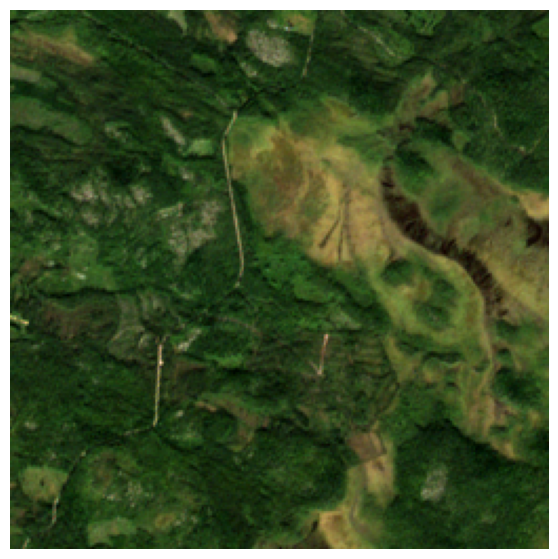

In [145]:
sample_feature = tifffile.imread('/home/cb/sis/biodata/train_features/' + train_downloads['filename'].iloc[33])
plot_feature_rgb(sample_feature)


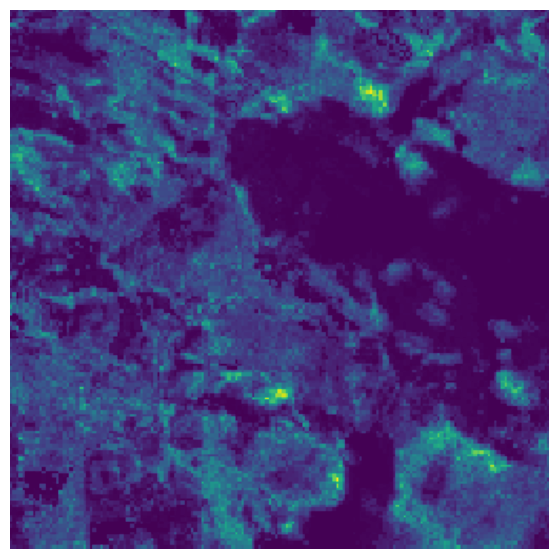

In [159]:
sample_agbm = tifffile.imread('/home/cb/sis/biodata/train_agbm/' + train_downloads['corresponding_agbm'].iloc[33])

plt.figure(figsize=(7,7))
plt.imshow(sample_agbm)
plt.axis('off')
plt.show()

In [175]:
tfrecord_path = '/home/cb/sis/biodata/train_tfrecords/*.tfrecord'
dataset = tf.data.TFRecordDataset(tfrecord_path)

In [227]:
import os

# Directory containing the TFRecord files
data_dir = '/home/cb/sis/biodata/train_tfrecords'

# Get a list of all TFRecord files in the directory
file_list = [os.path.join(data_dir, file) for file in os.listdir(data_dir) if file.endswith('.tfrecord')]

dataset = tf.data.TFRecordDataset(file_list)
# dataset = tf.data.TFRecordDataset.list_files(data_dir + '/*.tfrecord')


dataset = dataset.map(parse_example)
# dataset = dataset.shuffle(...)
# dataset = dataset.batch(...)

/home/cb/sis/biodata/train_tfrecords/0003d2eb.tfrecord


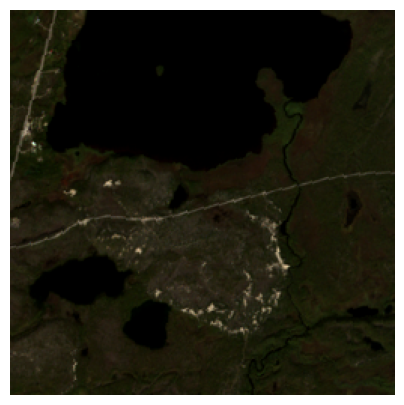

/home/cb/sis/biodata/train_tfrecords/001b0634.tfrecord


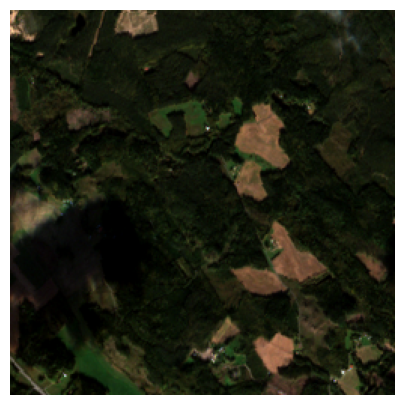

/home/cb/sis/biodata/train_tfrecords/0029317e.tfrecord


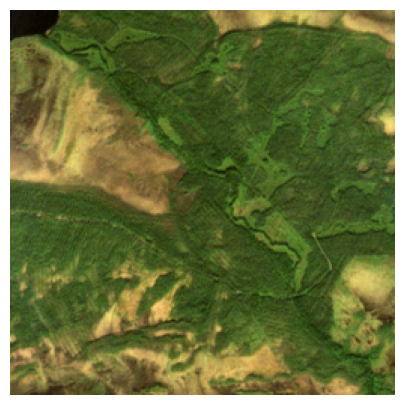

/home/cb/sis/biodata/train_tfrecords/00301627.tfrecord


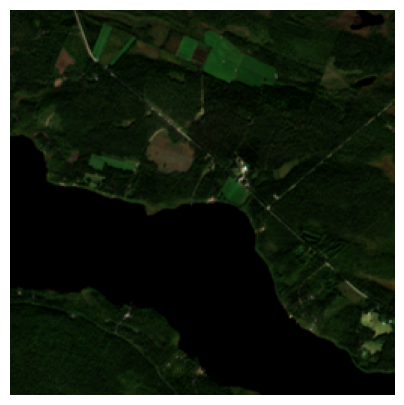

/home/cb/sis/biodata/train_tfrecords/003ab939.tfrecord


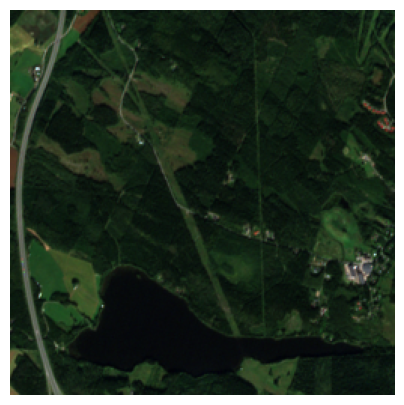

/home/cb/sis/biodata/train_tfrecords/0040c3a8.tfrecord


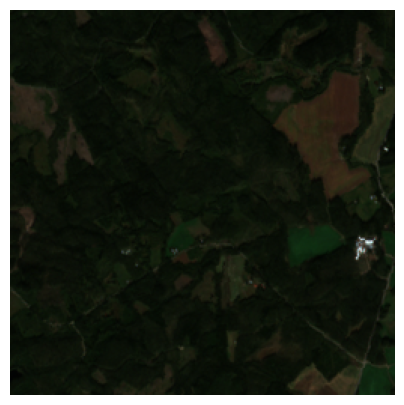

/home/cb/sis/biodata/train_tfrecords/0058fedc.tfrecord


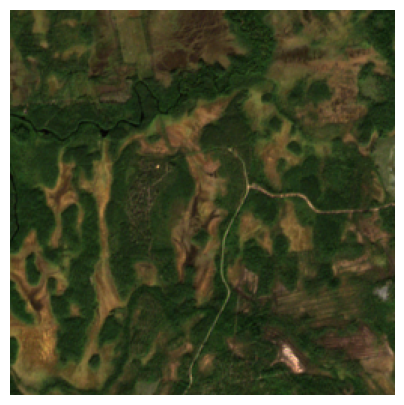

/home/cb/sis/biodata/train_tfrecords/0060c0a5.tfrecord


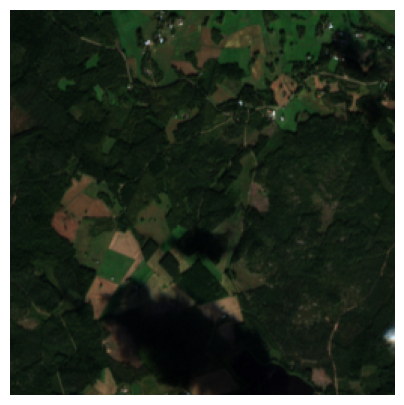

/home/cb/sis/biodata/train_tfrecords/0083efdf.tfrecord


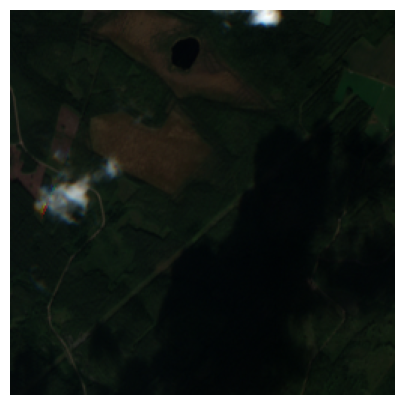

/home/cb/sis/biodata/train_tfrecords/008a52a9.tfrecord


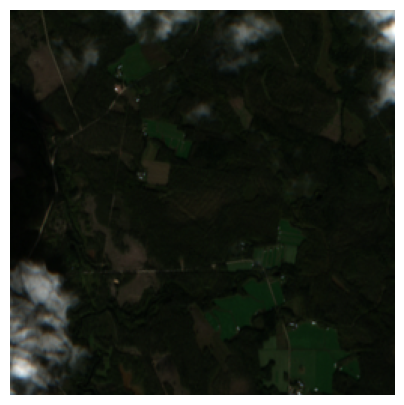

/home/cb/sis/biodata/train_tfrecords/00a0fcf3.tfrecord


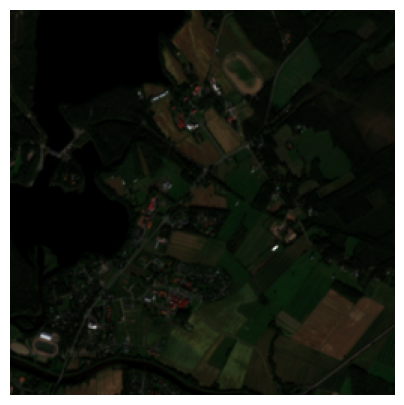

/home/cb/sis/biodata/train_tfrecords/00c03fbe.tfrecord


/tmp/ipykernel_213561/3285745566.py:4: RuntimeWarning: invalid value encountered in divide
  return (array - array_min) / (array_max - array_min)
/home/cb/.conda/envs/pygdal38/lib/python3.8/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


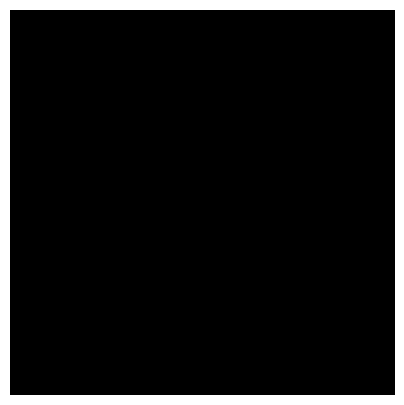

/home/cb/sis/biodata/train_tfrecords/00de40a4.tfrecord


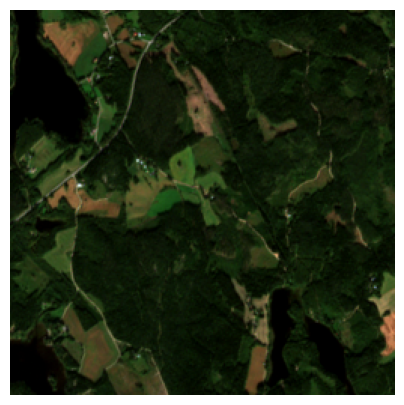

/home/cb/sis/biodata/train_tfrecords/00e6b793.tfrecord


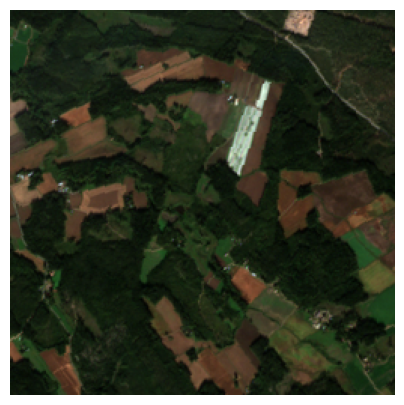

/home/cb/sis/biodata/train_tfrecords/00eee261.tfrecord


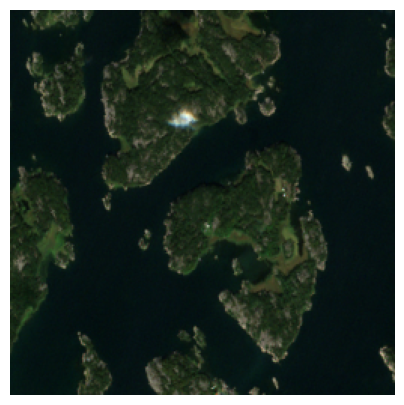

/home/cb/sis/biodata/train_tfrecords/00efbedd.tfrecord


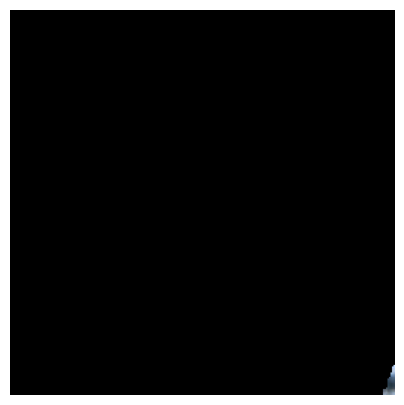

/home/cb/sis/biodata/train_tfrecords/00fc19b1.tfrecord


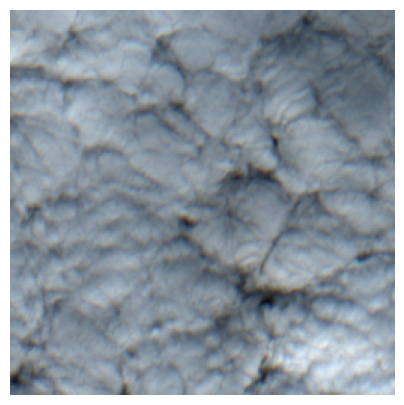

/home/cb/sis/biodata/train_tfrecords/00fd0698.tfrecord


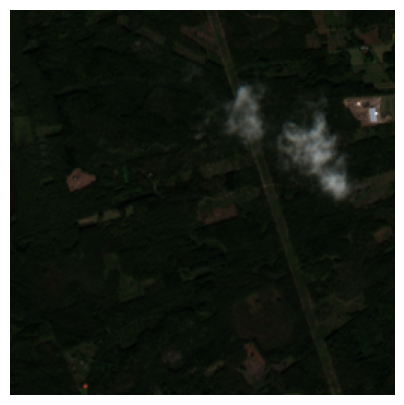

/home/cb/sis/biodata/train_tfrecords/010966cb.tfrecord


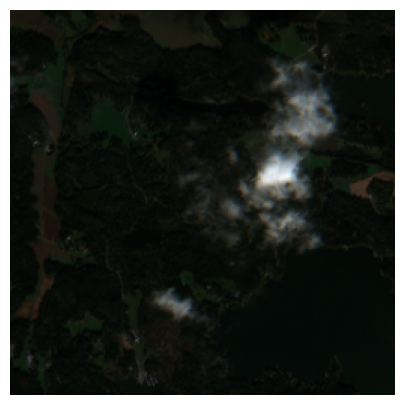

/home/cb/sis/biodata/train_tfrecords/011909e9.tfrecord


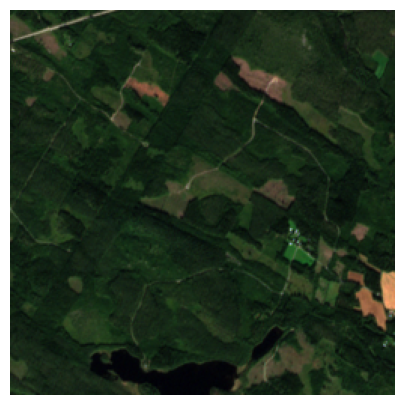

/home/cb/sis/biodata/train_tfrecords/0131497d.tfrecord


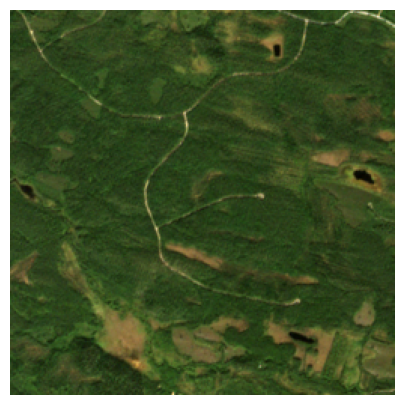

/home/cb/sis/biodata/train_tfrecords/0147ad59.tfrecord


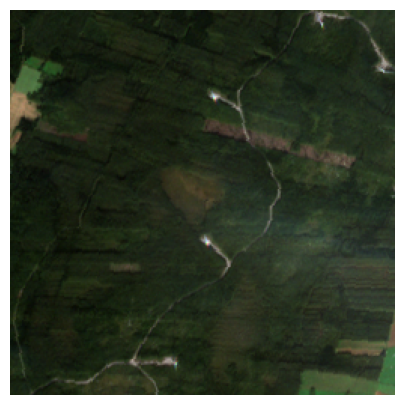

/home/cb/sis/biodata/train_tfrecords/01503e8a.tfrecord


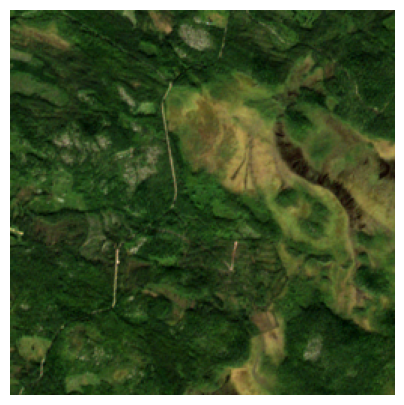

/home/cb/sis/biodata/train_tfrecords/0157cf88.tfrecord


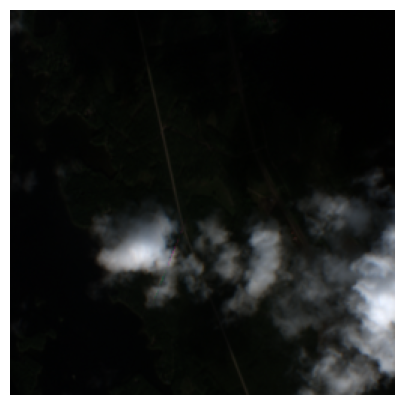

/home/cb/sis/biodata/train_tfrecords/0177cc36.tfrecord


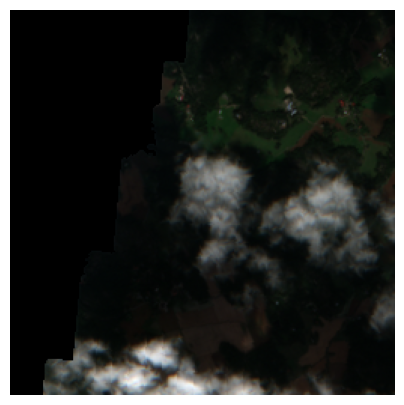

/home/cb/sis/biodata/train_tfrecords/017f206b.tfrecord


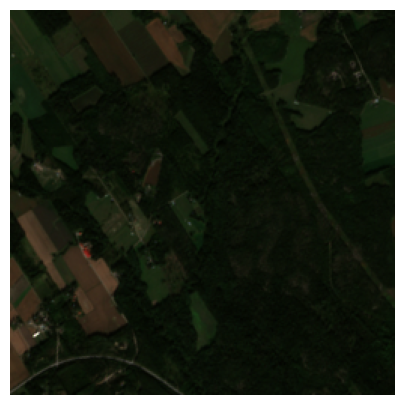

/home/cb/sis/biodata/train_tfrecords/0193cab1.tfrecord


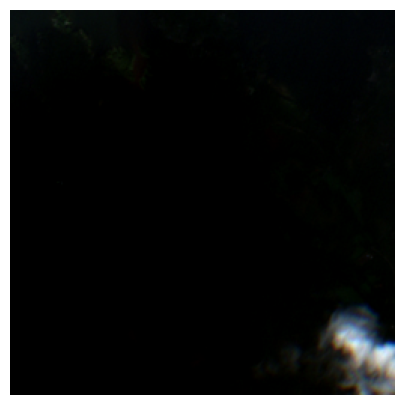

/home/cb/sis/biodata/train_tfrecords/01a92708.tfrecord


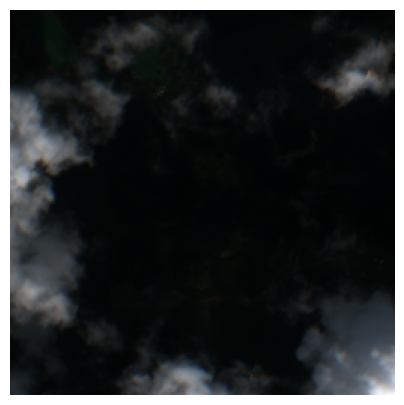

/home/cb/sis/biodata/train_tfrecords/01b7f786.tfrecord


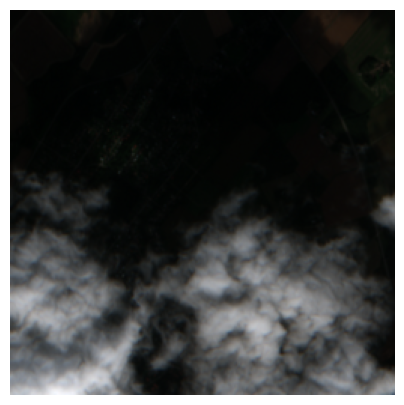

/home/cb/sis/biodata/train_tfrecords/01bc24f4.tfrecord


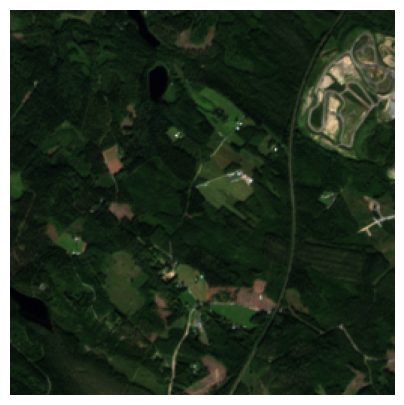

/home/cb/sis/biodata/train_tfrecords/01ce06f5.tfrecord


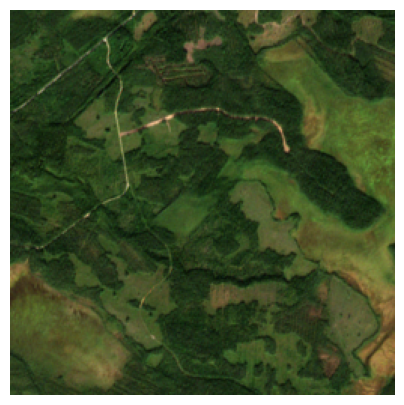

/home/cb/sis/biodata/train_tfrecords/01e1a71e.tfrecord


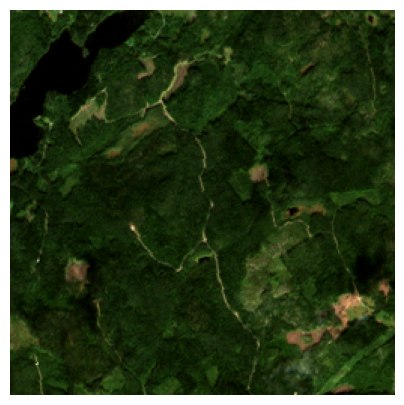

/home/cb/sis/biodata/train_tfrecords/01edae7b.tfrecord


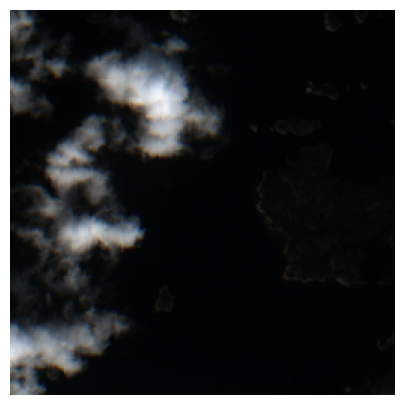

/home/cb/sis/biodata/train_tfrecords/01f1fef8.tfrecord


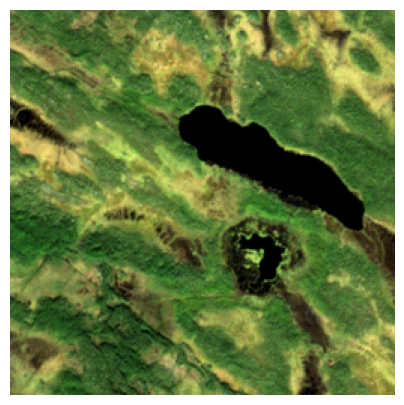

/home/cb/sis/biodata/train_tfrecords/01f7f810.tfrecord


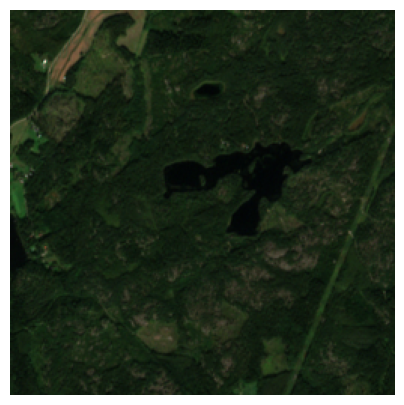

/home/cb/sis/biodata/train_tfrecords/01fec683.tfrecord


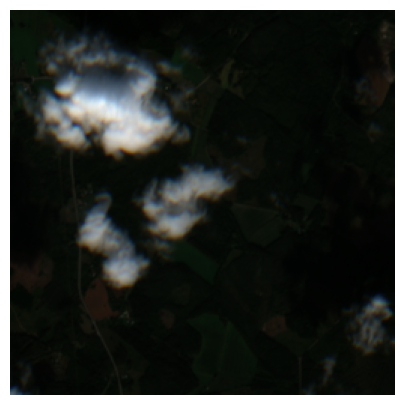

/home/cb/sis/biodata/train_tfrecords/020c0e93.tfrecord


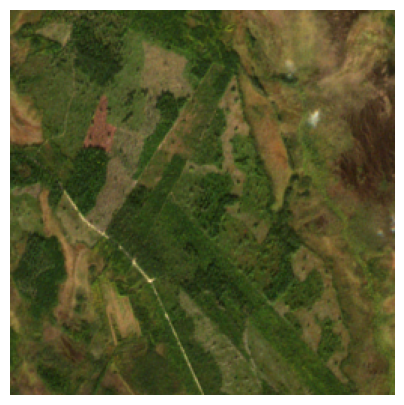

/home/cb/sis/biodata/train_tfrecords/02168744.tfrecord


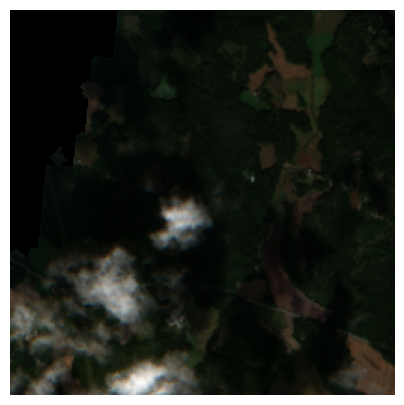

/home/cb/sis/biodata/train_tfrecords/0226fb18.tfrecord


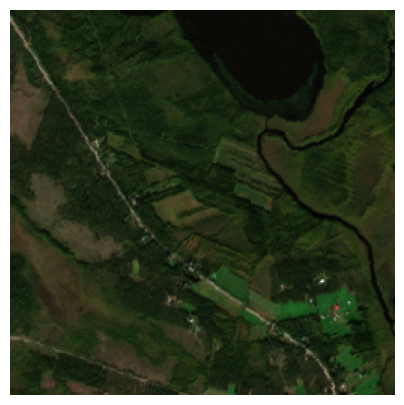

/home/cb/sis/biodata/train_tfrecords/022b4d29.tfrecord


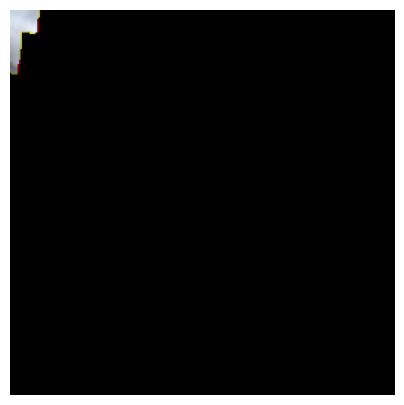

/home/cb/sis/biodata/train_tfrecords/023bff29.tfrecord


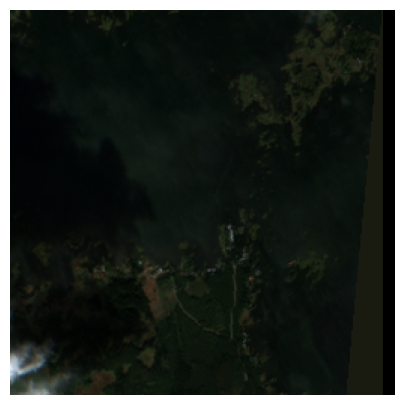

/home/cb/sis/biodata/train_tfrecords/023f5e10.tfrecord


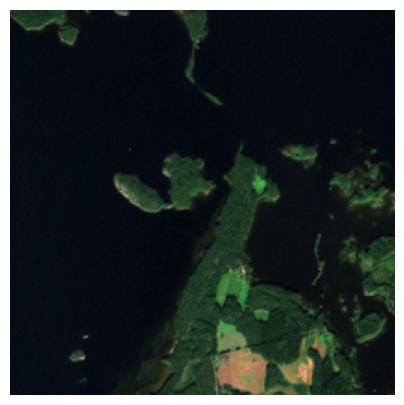

/home/cb/sis/biodata/train_tfrecords/025b36b1.tfrecord


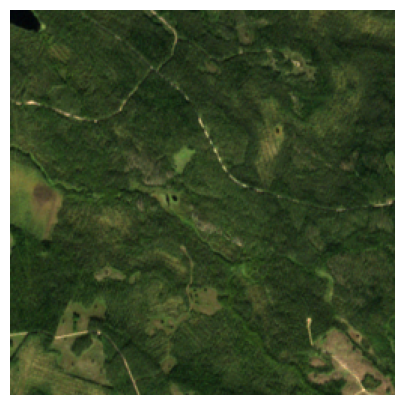

/home/cb/sis/biodata/train_tfrecords/02613007.tfrecord


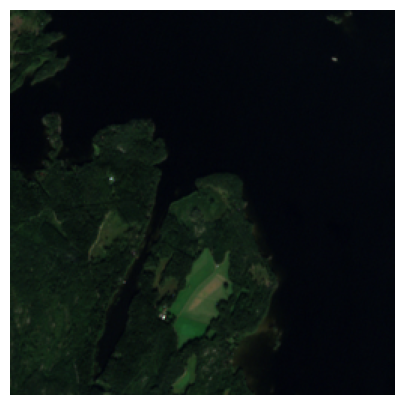

/home/cb/sis/biodata/train_tfrecords/02763d7a.tfrecord


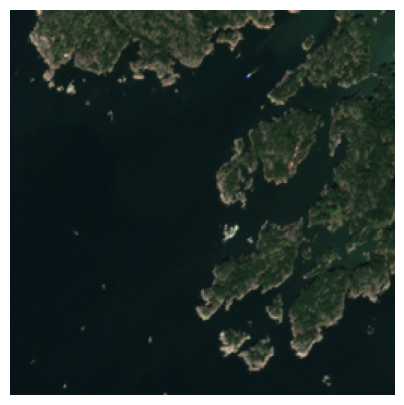

/home/cb/sis/biodata/train_tfrecords/027a4ff4.tfrecord


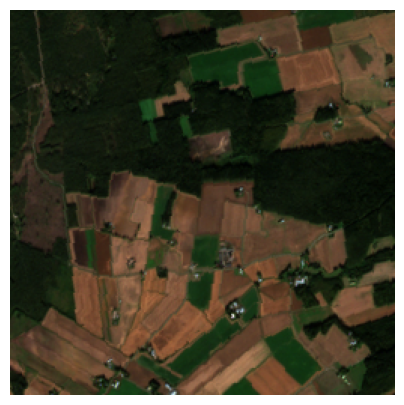

/home/cb/sis/biodata/train_tfrecords/0287b450.tfrecord


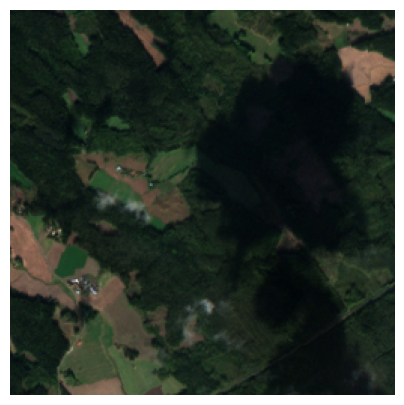

/home/cb/sis/biodata/train_tfrecords/0291ee27.tfrecord


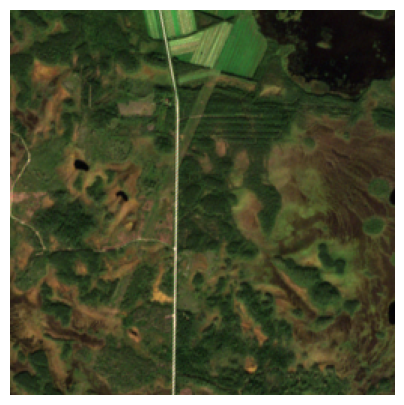

/home/cb/sis/biodata/train_tfrecords/02a603ee.tfrecord


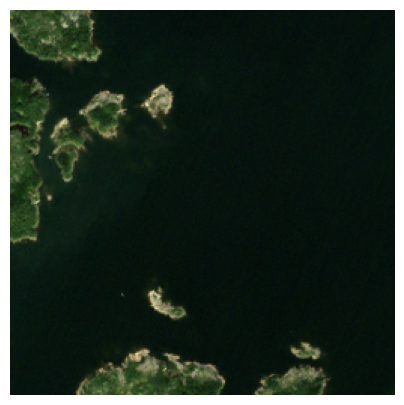

/home/cb/sis/biodata/train_tfrecords/02a7f72f.tfrecord


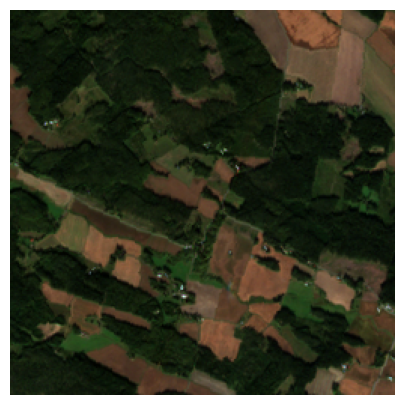

In [231]:
for sample_file in file_list:
    print(sample_file)

    sample_dataset = tf.data.TFRecordDataset(sample_file)
    for element in sample_dataset:
        inp, re = parse_example(element)
        plot_feature_rgb(inp.numpy())
        # plot_agbm(re.numpy())


In [232]:
# n = 0
# for a1, a2 in dataset:
#     # print(n)
#     # print(a1.shape)
#     n += 1
#     # if n == 34:
#     print(file_list[n])
#     plot_feature_rgb(a1.numpy())